# Nii

NII 格式可以用，MRIcroGL 進行檢視。同時可以用 Python SimpleITK 進行轉換。

- MRIcroGL : https://www.nitrc.org/projects/mricrogl/

- simpleitk : https://simpleitk.readthedocs.io/en/master/gettingStarted.html

## Data

- FeTS2022

## Reference

- https://blog.csdn.net/HKISAHJFJKDJKHN/article/details/111273390

- https://blog.csdn.net/qq_32863339/article/details/88295285

## Data process

In [1]:
!gzip -d FeTS2022_00131.nii.gz

## 导入 .nii 文件

sitk.GetArrayFromImage()返回值为numpy类型

In [2]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np

filename_PET = 'FeTS2022_00131.nii'

PET_itk = sitk.ReadImage(fileName=filename_PET)
PET_img = sitk.GetArrayFromImage(PET_itk)

Z_pet, X_pet, Y_pet = PET_img.shape

## 导出 .nii 文件

In [3]:
out = sitk.GetImageFromArray(PET_img)
sitk.WriteImage(out, filename_PET)

## 显示 .nii 文件中各层图片 

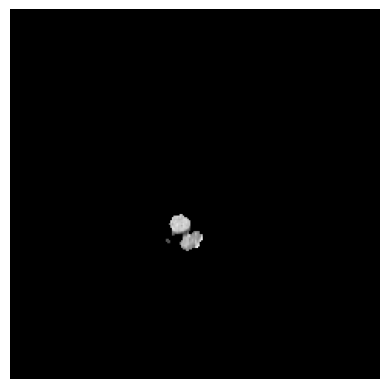

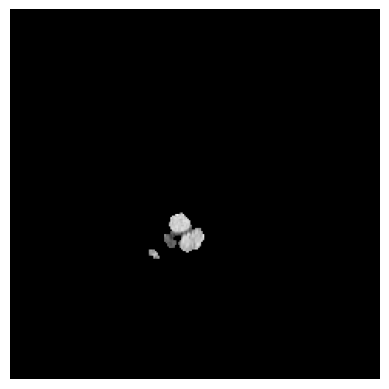

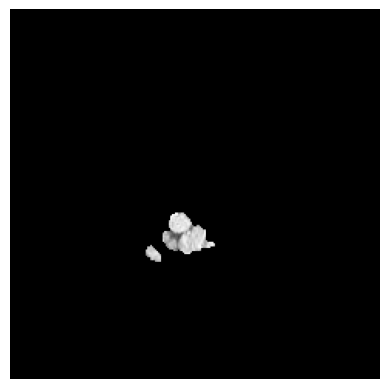

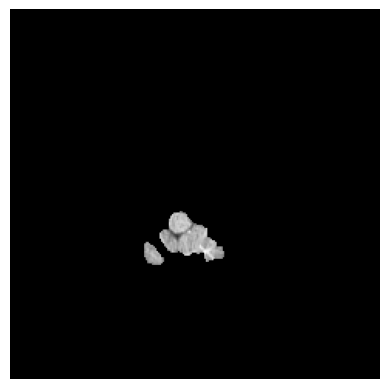

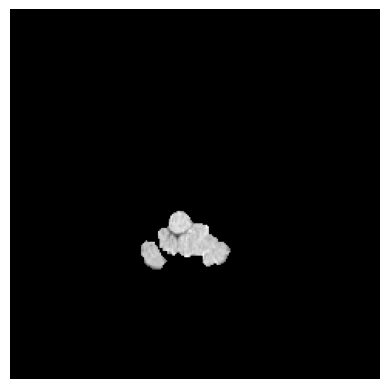

...

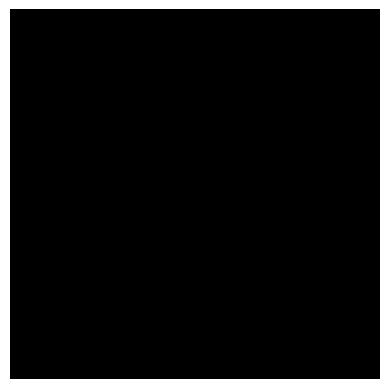

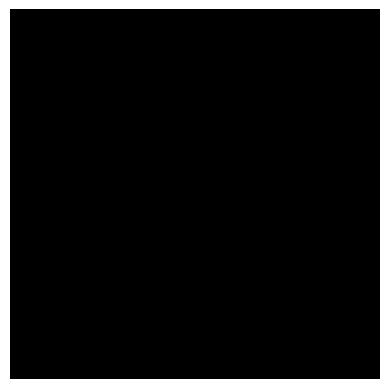

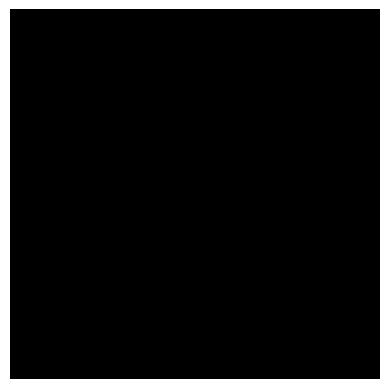

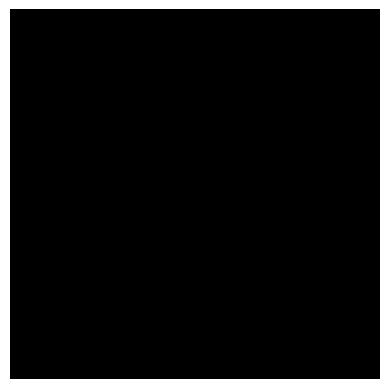

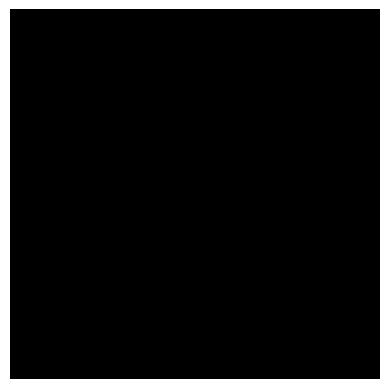

In [4]:
for item in PET_img:
    plt.imshow(item, cmap='Greys_r')
    plt.axis('off')
    plt.show()

## 使用 SimpleITK 读取和保存 NIfTI 文件

In [5]:
## using simpleITK to load and save data.
import SimpleITK as sitk
SAVE_NII_GZ_PATH = 'FeTS2022_00131.nii.gz'
itk_img = sitk.ReadImage(SAVE_NII_GZ_PATH)
img = sitk.GetArrayFromImage(itk_img)
print("img shape:",img.shape)
 
## save 
out = sitk.GetImageFromArray(img)
# # out.SetSpacing(itk_img.GetSpacing())
# # out.SetOrigin(itk_img.GetOrigin())
sitk.WriteImage(out, SAVE_NII_GZ_PATH)

img shape: (155, 240, 240)


## nii_to_png

In [6]:
def convert_from_nii_to_png(img):
    high = np.quantile(img,0.99)
    low = np.min(img)
    img = np.where(img > high, high, img)
    lungwin = np.array([low * 1., high * 1.])
    newimg = (img - lungwin[0]) / (lungwin[1] - lungwin[0])  
    newimg = (newimg * 255).astype(np.uint8)
    return newimg

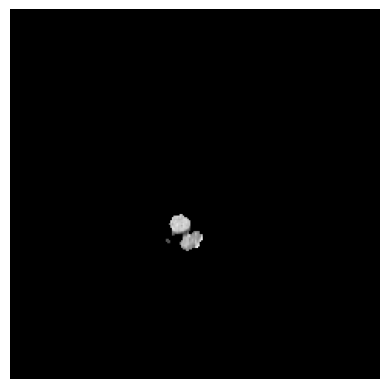

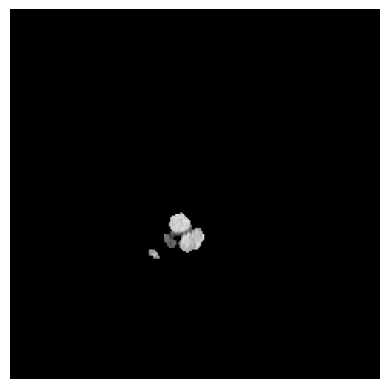

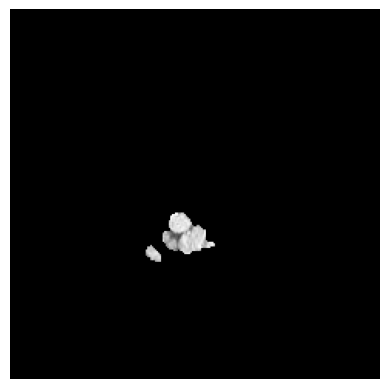

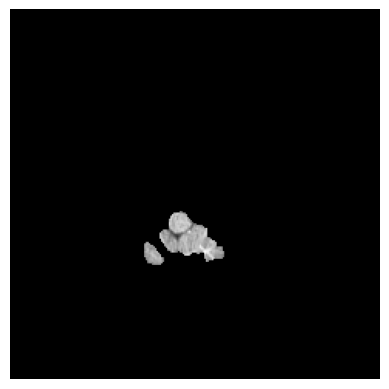

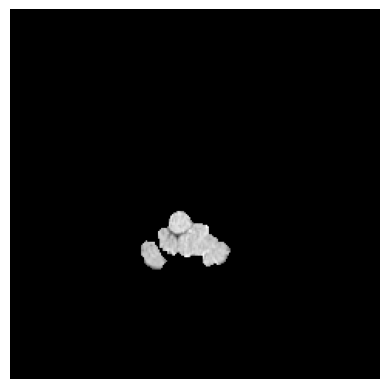

...

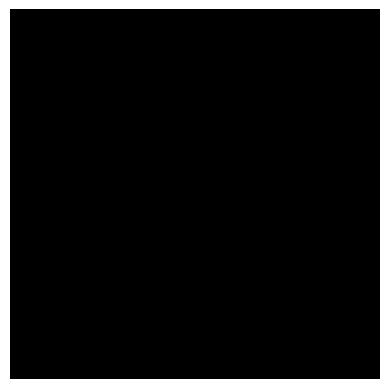

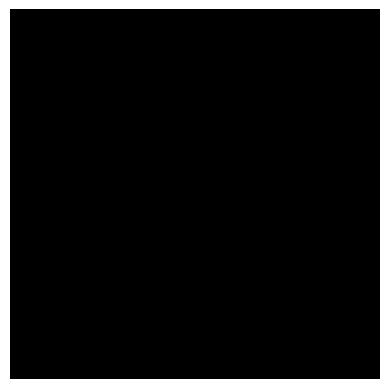

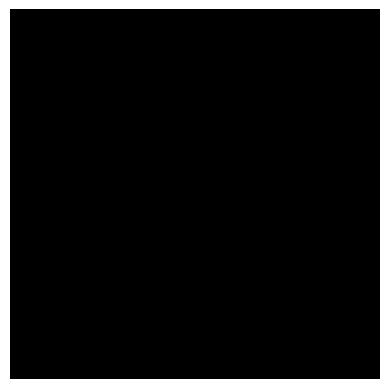

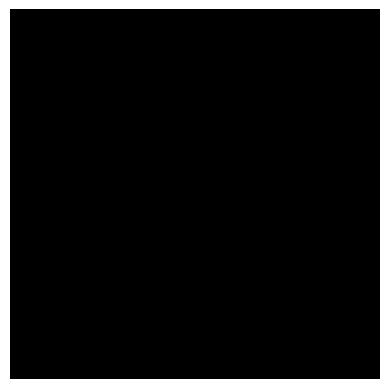

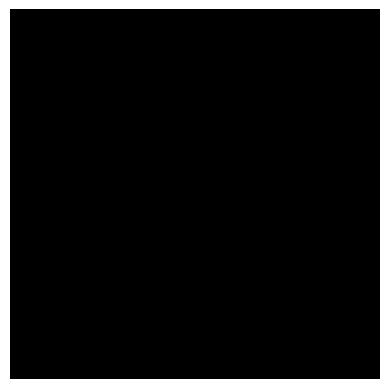

nii_to_png_fig_20230731005151


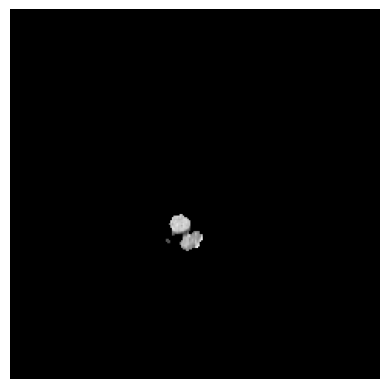

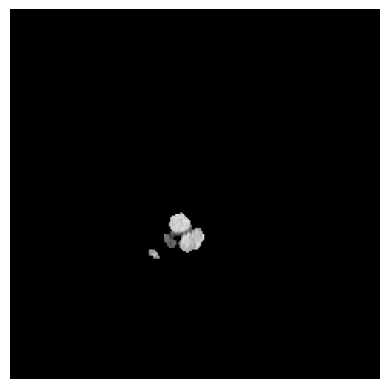

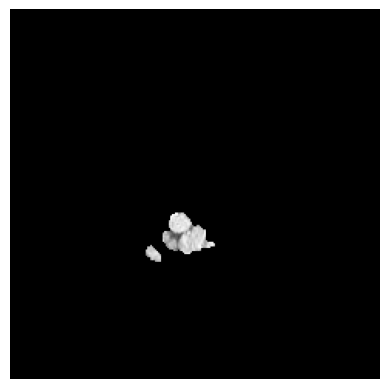

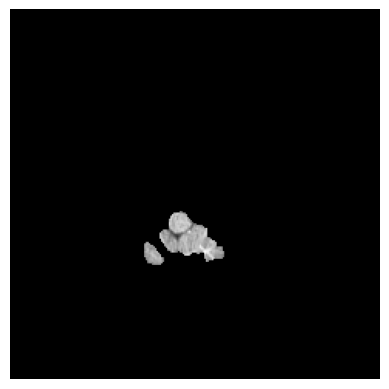

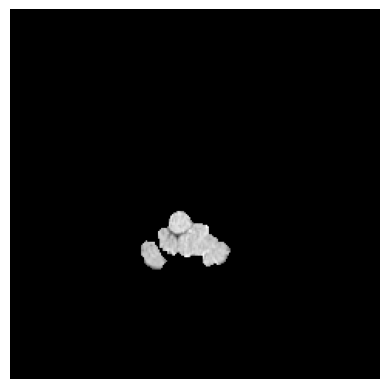

...

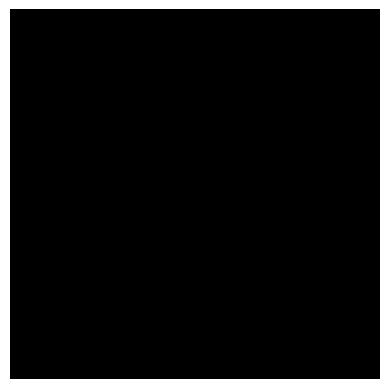

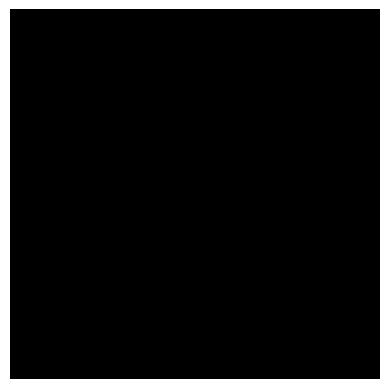

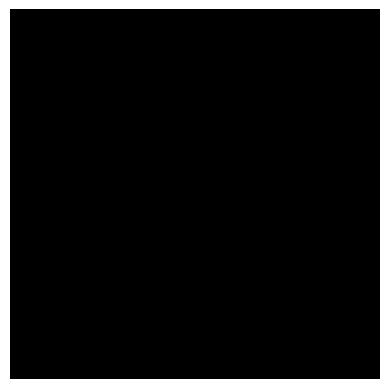

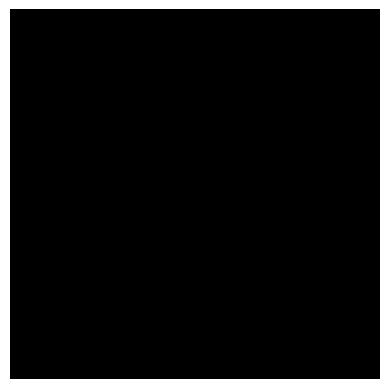

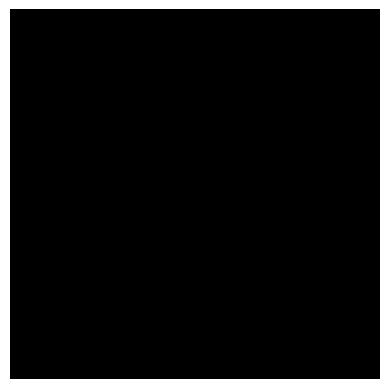

In [7]:
import SimpleITK as sitk
import time
import os
SAVE_NII_GZ_PATH = 'FeTS2022_00131.nii.gz'
v_itk_img = sitk.ReadImage(SAVE_NII_GZ_PATH)
v = sitk.GetArrayFromImage(v_itk_img)
v = convert_from_nii_to_png(v)
# print(v)
for item in v:
    plt.imshow(item, cmap='Greys_r')
    plt.axis('off')
    plt.show()
fname = "nii_to_png_fig_"+time.strftime('%Y%m%d%H%M%S', time.localtime())
print(fname)
# 指定图片保存路径
figure_save_path = fname
if not os.path.exists(figure_save_path):
    os.makedirs(figure_save_path) # 如果不存在目录 figure_save_path ，则创建
    for idx, item in enumerate(v):
        fname = "nii_to_png_fig_" + time.strftime('%Y%m%d%H%M%S', time.localtime())
        plt.imshow(item, cmap='Greys_r')
        plt.axis('off')
        sysfn = fname + '_' + str(idx) + '.png'
        plt.savefig(os.path.join(figure_save_path , sysfn))
        plt.show()

In [8]:
fruits = ["apple", "banana", "cherry"]
for idx, element in enumerate(fruits):
  print(idx, element) 

0 apple
1 banana
2 cherry


## 存储图片同一个文件夹中

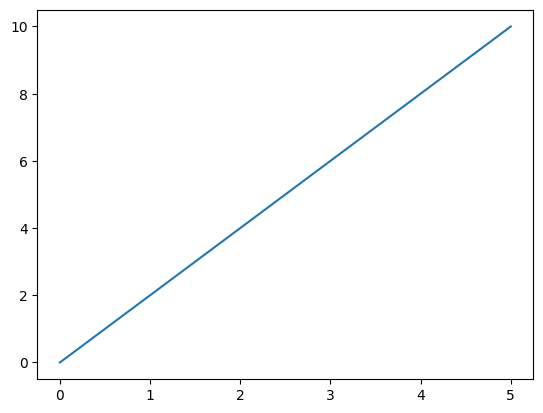

In [9]:
import matplotlib.pyplot as plt
import os #注意要输入OS模块
x=[0,1,2,3,4,5]
y=[0,2,4,6,8,10]
plt.plot(x,y)
# 指定图片保存路径
figure_save_path = "file_fig"
if not os.path.exists(figure_save_path):
    os.makedirs(figure_save_path) # 如果不存在目录 figure_save_path ，则创建
plt.savefig(os.path.join(figure_save_path , 'exam.png'))#第一个是指存储路径，第二个是图片名字
plt.show()